In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def load_img():
    img = cv2.imread('../Computer-Vision-with-Python/DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
# Load_img()

In [5]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

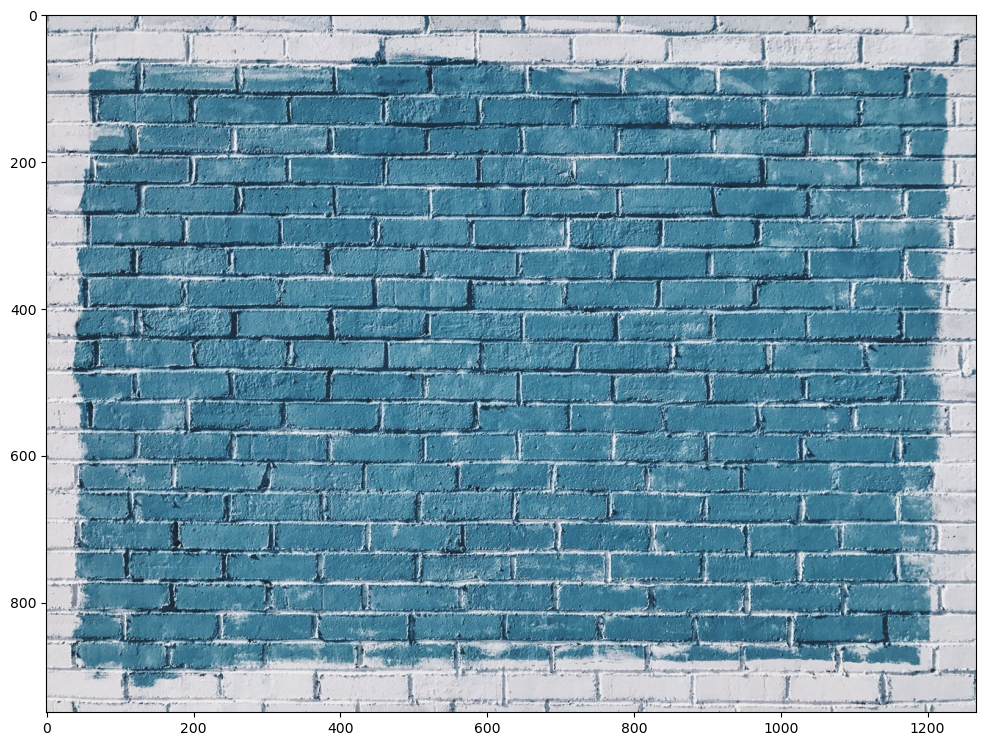

In [6]:
i = load_img()
display_img(i)

In [16]:
gamma = 1/10

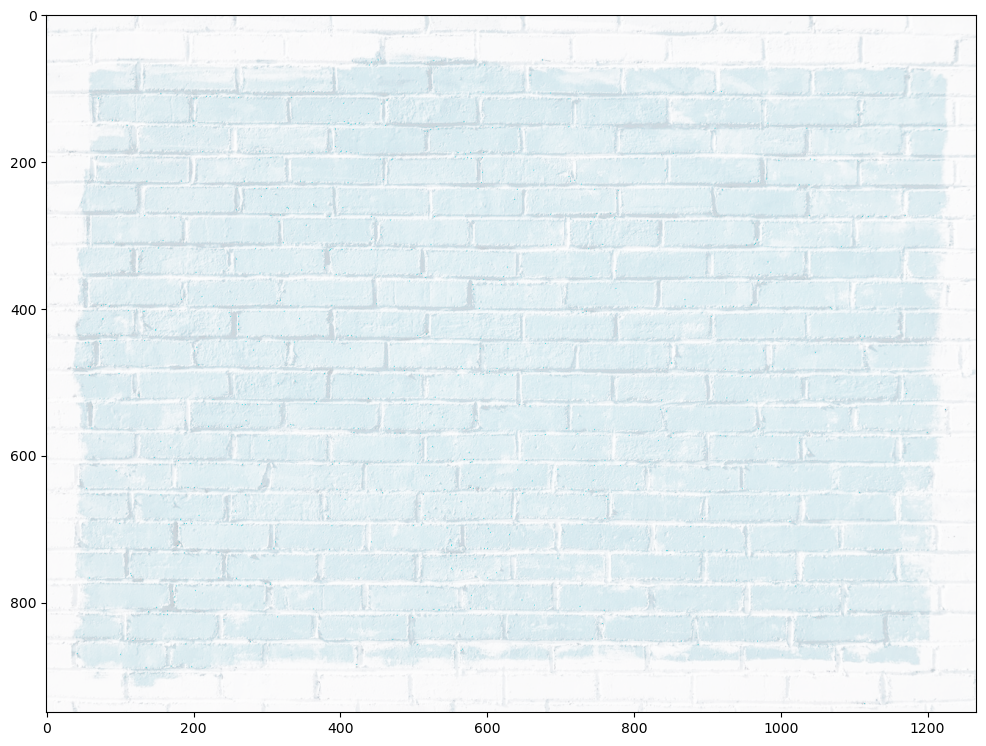

In [17]:
result = np.power(i, gamma)
# 감마 조정: 픽셀 배열 값을 취한 다음, 감마 수치로 곱하는 것. np.power로 사용 가능. 
display_img(result)

In [18]:
# 블러링 : 2D 콘볼루션, 로우 패스 필터로 알려진 기능
# 이미지에 어떤 텍스트를 입력. 블러링과 스무딩의 차이점 확인하기 위해 

In [19]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text='bricks', org=(10, 600), fontFace = font, fontScale=10, color=(255, 0, 0), thickness=4)

array([[[0.78431374, 0.7882353 , 0.80784315],
        [0.7529412 , 0.77254903, 0.79607844],
        [0.7254902 , 0.7647059 , 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8784314 , 0.88235295, 0.9019608 ],
        [0.7647059 , 0.78431374, 0.80784315],
        [0.7019608 , 0.7529412 , 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.85490197, 0.8666667 , 0.89411765],
        [0.6509804 , 0.6784314 , 0.70980394],
        [0.4862745 , 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


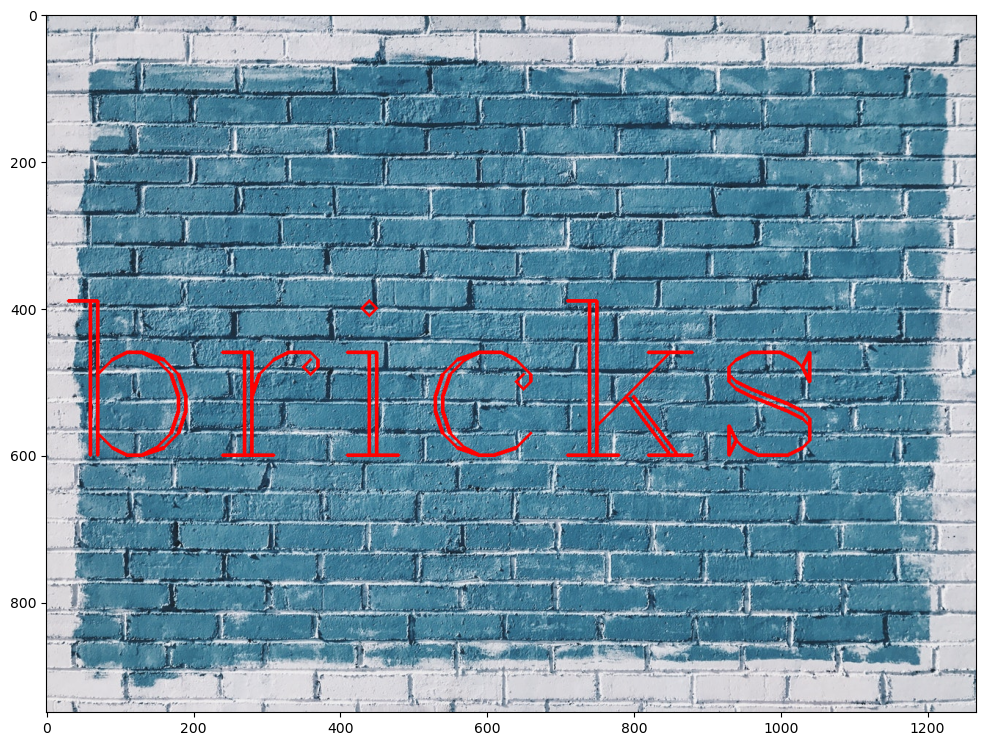

In [20]:
display_img(img)

In [28]:
kernel = np.ones(shape=(5,5), dtype=np.float32)/25

In [29]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


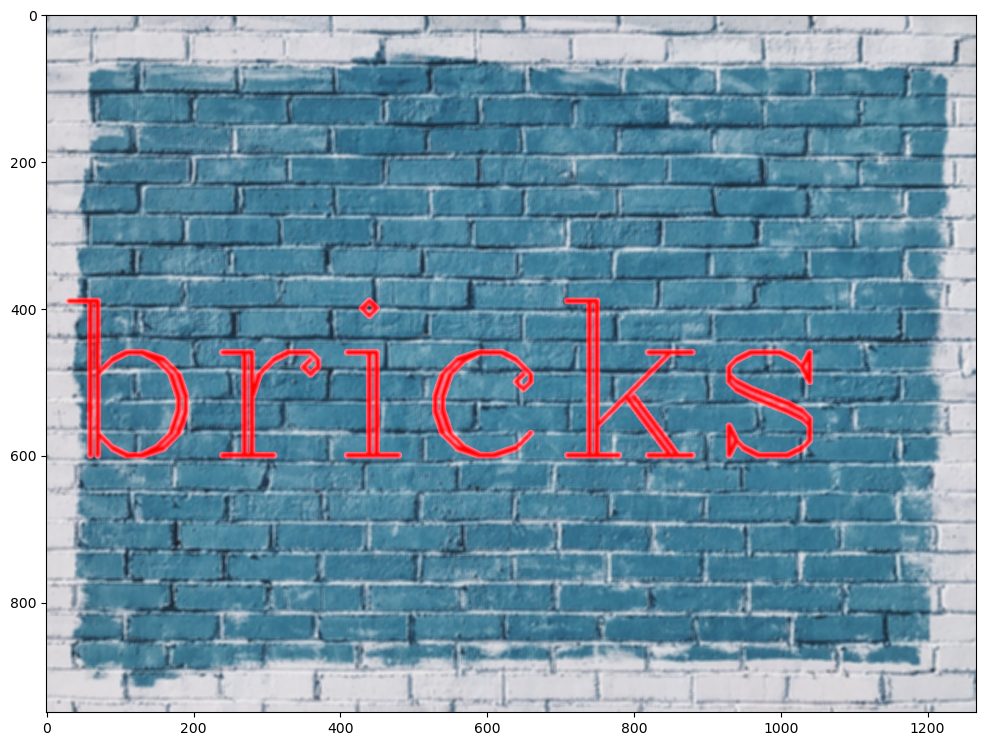

In [30]:
# dst destination
dst = cv2.filter2D(img,-1, kernel)
display_img(dst)

In [31]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text='bricks', org=(10, 600), fontFace = font, fontScale=10, color=(255, 0, 0), thickness=4)
print('reset')

reset


In [32]:
# 평균 값을 가지고 스무딩 하는 방법 
# 블러링된 커널의 기본값이 이미 있음. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


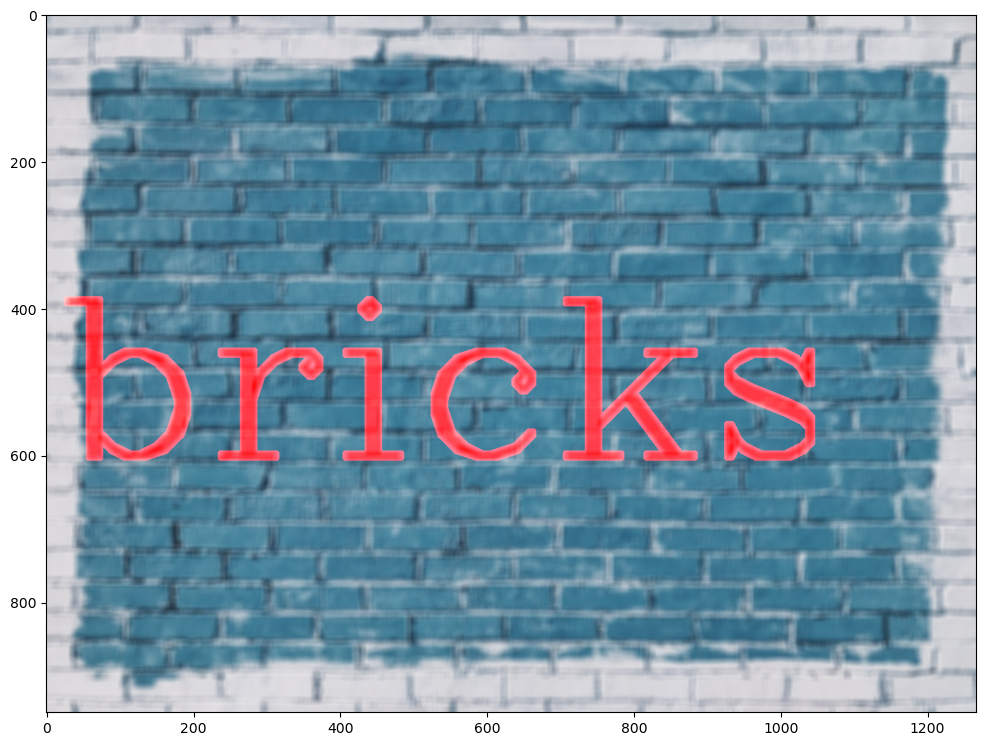

In [34]:
blurred = cv2.blur(img, ksize=(10,10))
display_img(blurred)

In [35]:
# 가우시안 블러링, 미디안 블러링

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


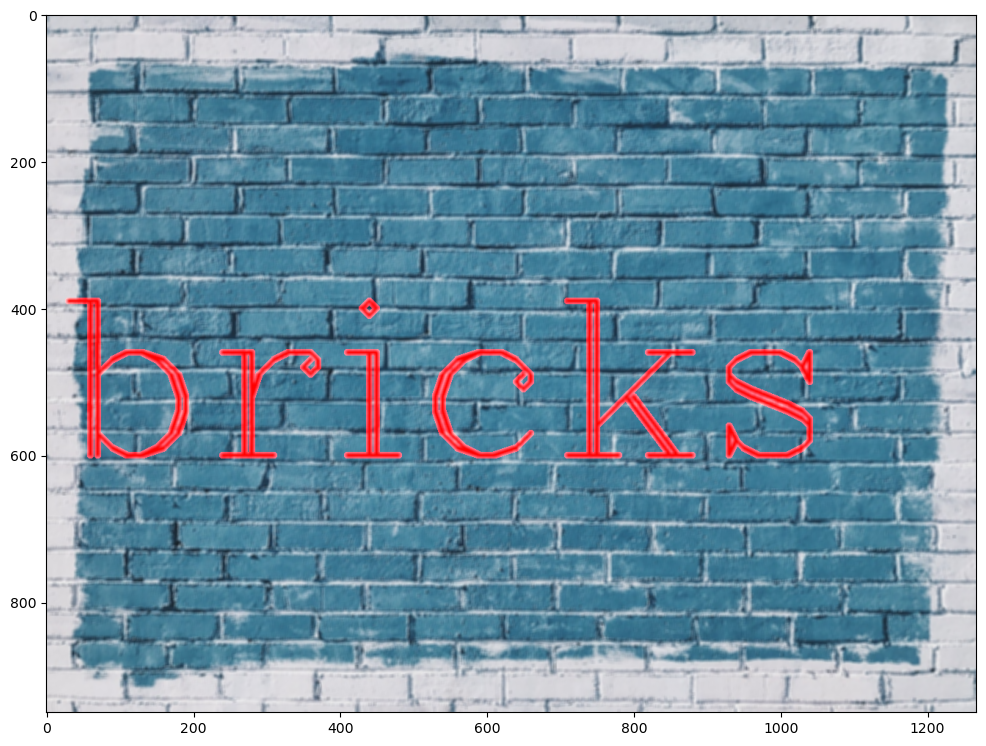

In [36]:
blurred_img = cv2.GaussianBlur(img, (5,5),10)
display_img(blurred_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


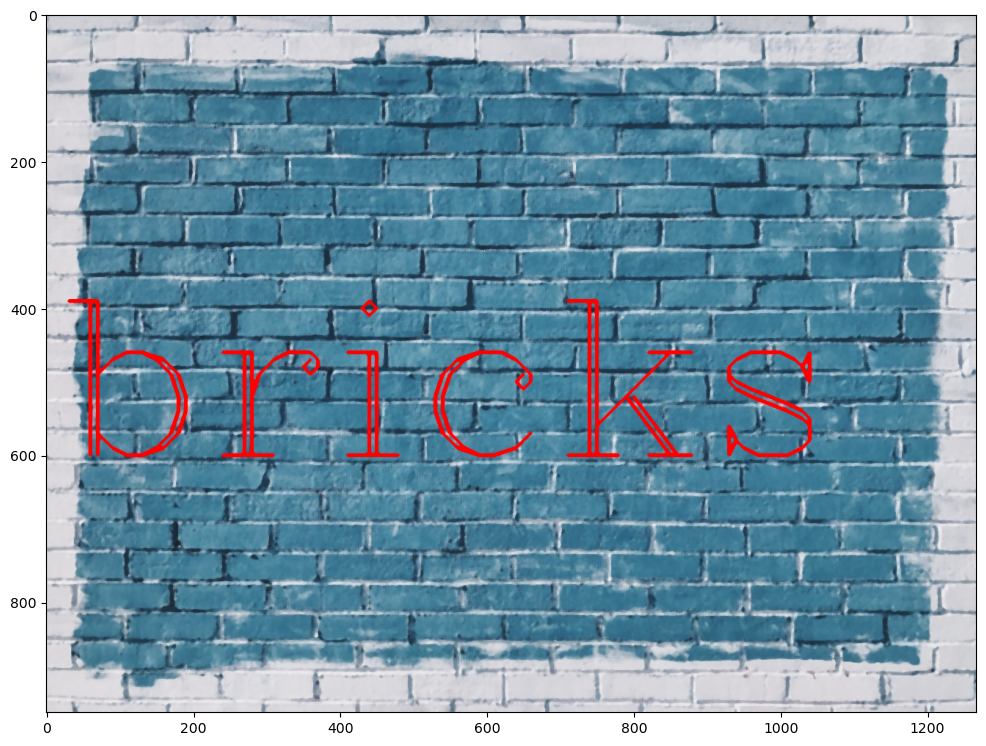

In [37]:
# 미디안 블러링(뒷 배경이 흐려지고 글자 사이에 블록 배경이 보이는 것을 알 수 있음)
# 디테일을 챙기면서 이미지의 노이즈를 제거하는 데에는 아주 좋음. 흥미로운 테크닉. 
median_result = cv2.medianBlur(img, 5)
display_img(median_result)

In [38]:
img = cv2.imread('../Computer-Vision-with-Python/DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

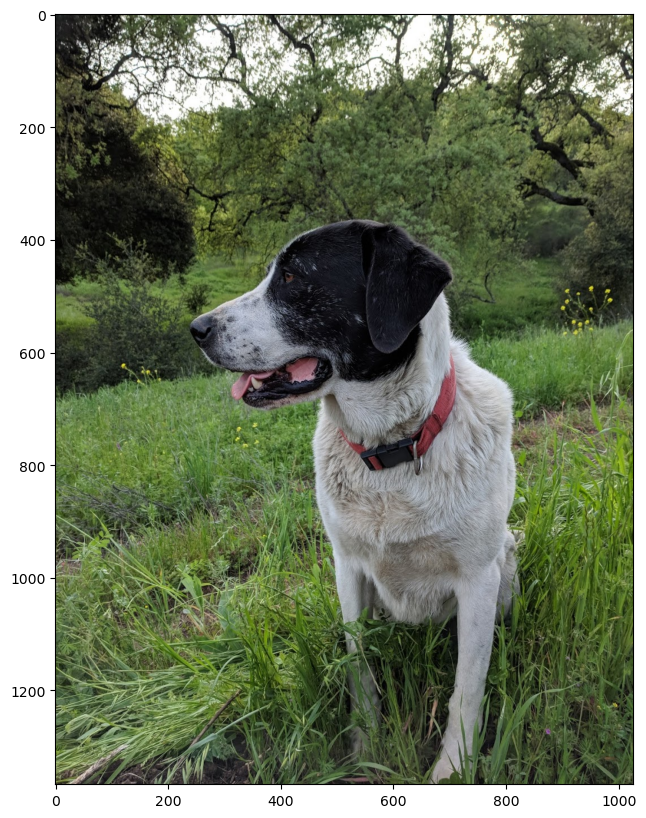

In [40]:
display_img(img)

In [41]:
noise_img = cv2.imread('../Computer-Vision-with-Python/DATA/sammy_noise.jpg')

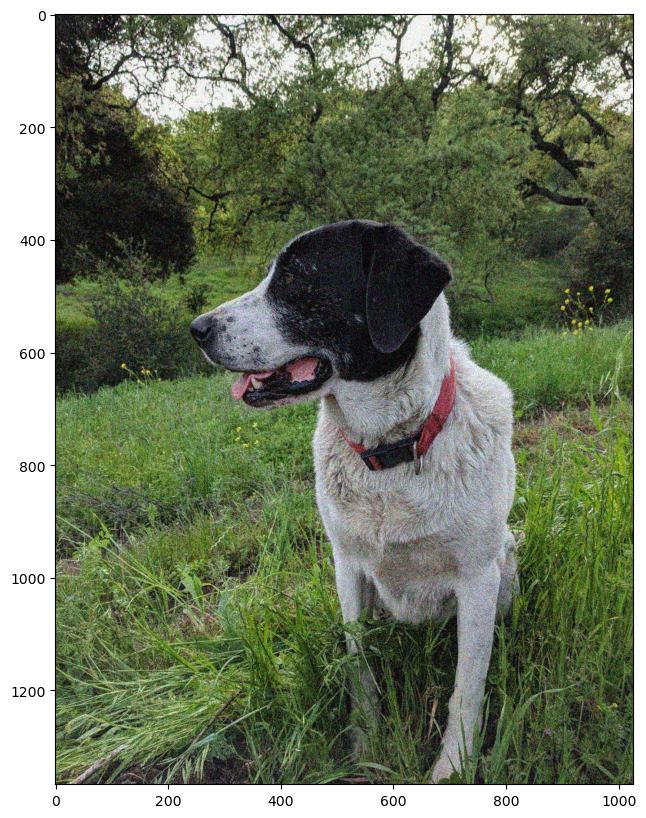

In [42]:
display_img(noise_img)

In [43]:
# 이러한 노이즈를 수정하거나 삭제할 수 있는 미디안블러 사용하기

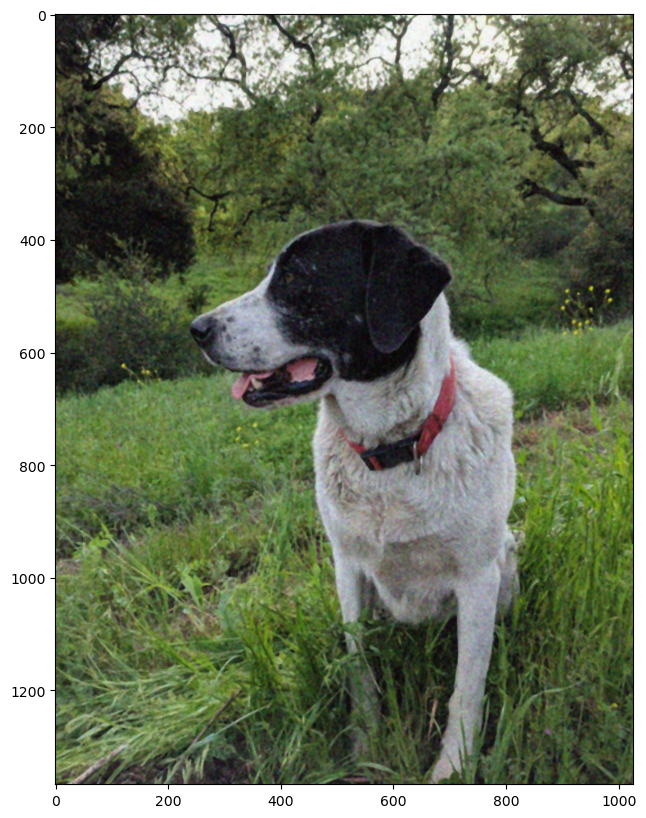

In [51]:
median = cv2.medianBlur(noise_img, 5)
display_img(median)

In [52]:
# 양방향 필터, 이미지를 블러링 하는 다른 방법. 
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text='bricks', org=(10, 600), fontFace = font, fontScale=10, color=(255, 0, 0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


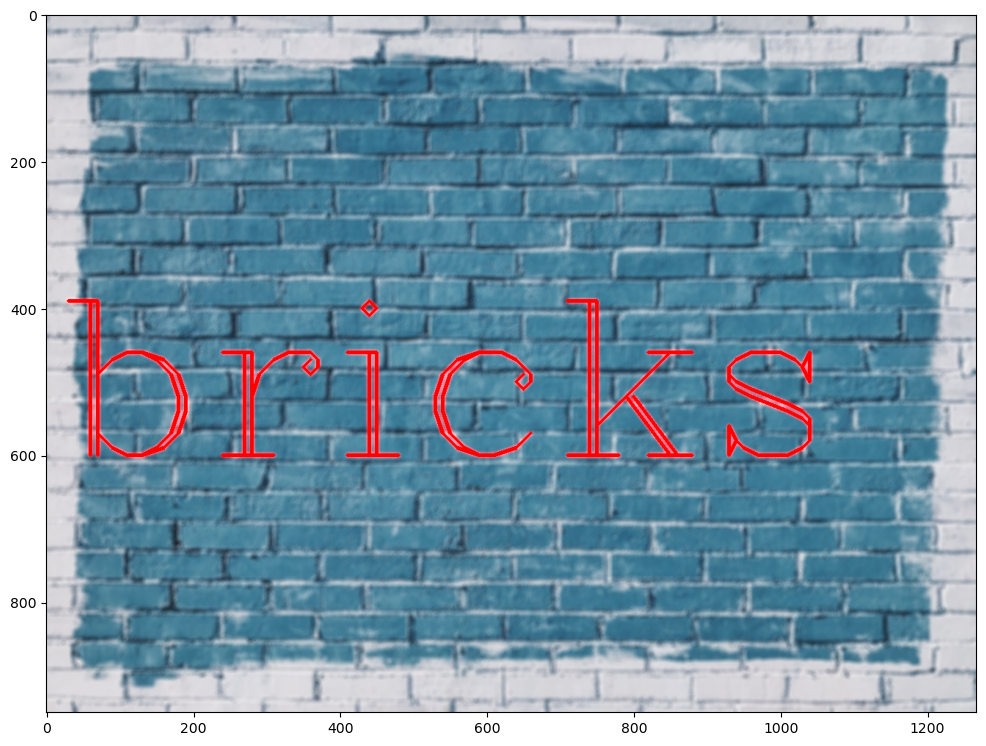

In [54]:
blur = cv2.bilateralFilter(img, 9, 75, 75)
display_img(blur)